/opt/anaconda3/lib/python3.5/site-packages/statsmodels/compat/pandas.py:56: FutureWarning: The pandas.core.datetools module is deprecated and will be removed in a future version. Please use the pandas.tseries module instead.
  from pandas.core import datetools


::

    Number of Observations - 309 (Annual 1700 - 2008)
    Number of Variables - 1
    Variable name definitions::

        SUNACTIVITY - Number of sunspots for each year

    The data file contains a 'YEAR' variable that is not returned by load.

Total: 309 | Obs: 61 (19.741100323624597%)


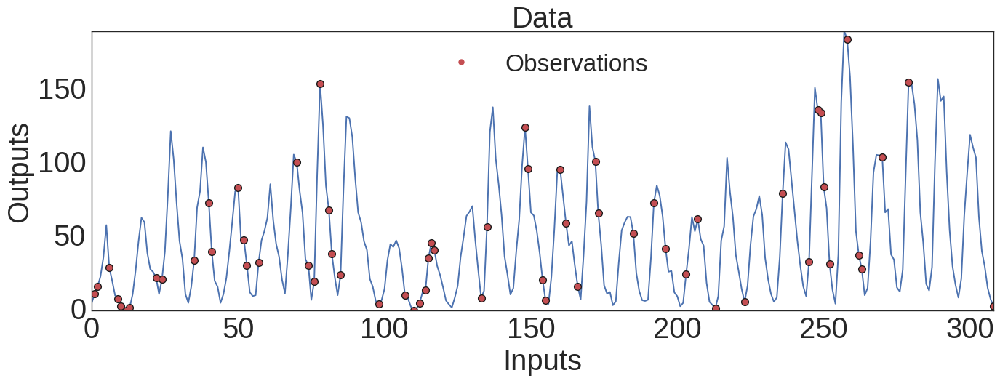

In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

import numpy as np
import pandas as pd
import g3py as g3
import theano as th
import matplotlib.pyplot as plt

th.config.warn_float64 = 'raise'

g3.style_big()
g3.style_widget()

np.random.seed(123456)
x, y = g3.data_sunspots()
obs_j, x_obs, y_obs, test_j, x_test, y_test = g3.random_obs(x, y, 0.2)

# GP Marginal (OK)

In [2]:
gp = g3.GaussianProcess(space=x, location=g3.Bias(x), 
                        kernel=g3.KernelNoise(x), hidden = y, noisy=False)
gp.observed(x_obs, y_obs)

'Starting function value (-logp): 317.474'
'start_bfgs'
Optimization terminated successfully.
         Current function value: 317.474213
         Iterations: 0
         Function evaluations: 1
         Gradient evaluations: 1
'find_MAP'
{'GP_Bias_Bias': 48.700001,
 'GP_KernelNoise_var_log_': array(7.571113586425781, dtype=float32)}


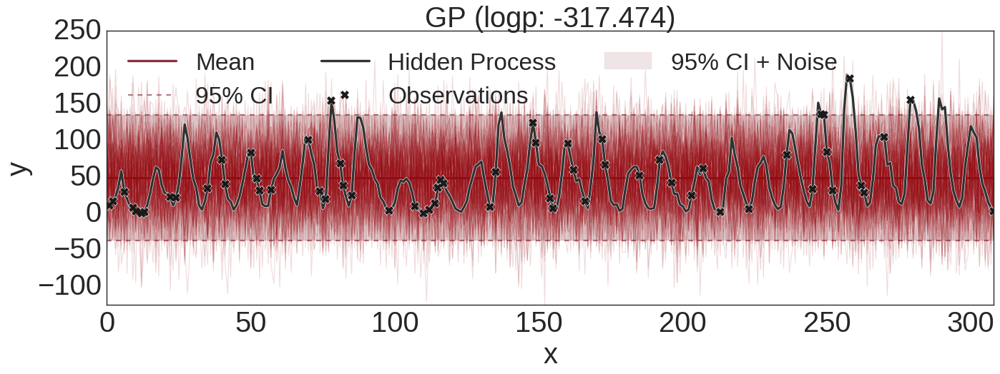

'Starting function value (-logp): 317.474'
'start_powell'
Optimization terminated successfully.
         Current function value: 317.474182
         Iterations: 1
         Function evaluations: 39
'find_MAP'
{'GP_Bias_Bias': array(48.71360397338867, dtype=float32),
 'GP_KernelNoise_var_log_': array(7.571070671081543, dtype=float32)}


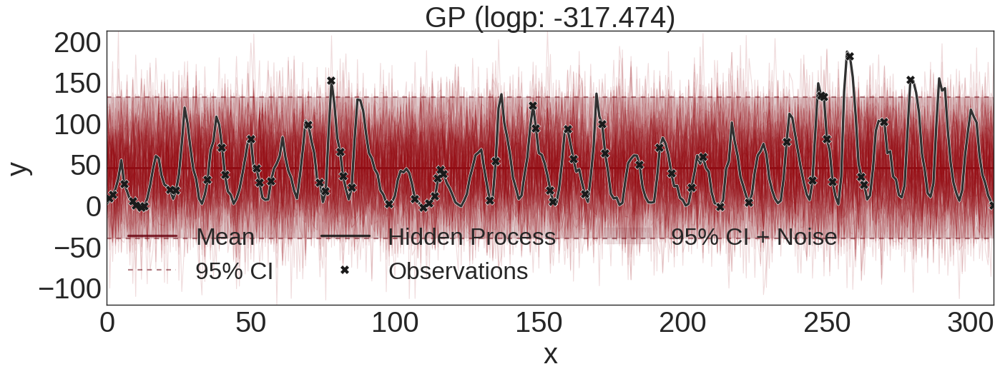

In [3]:
p = gp.find_MAP(points=1, init='bfgs')
gp.plot(p, samples=100)
g3.show()
p = gp.find_MAP(points=1, init='powell')
gp.plot(p, samples=100)

# GP SE + KernelNoise (OK)

In [4]:
gp = g3.GaussianProcess(space=x, location=g3.Bias(x), kernel=g3.SE(x) + g3.KernelNoise(x), 
                        hidden = y, noisy=False)
gp.observed(x_obs, y_obs)

'Starting function value (-logp): 319.155'
'start_bfgs'
         Current function value: 313.977722
         Iterations: 13
         Function evaluations: 102
         Gradient evaluations: 90
'find_MAP'
{'GP_Bias_Bias': array(47.96167755126953, dtype=float32),
 'GP_KernelNoise_var_log_': array(7.282400131225586, dtype=float32),
 'GP_SE_rate_log_': array([-3.01635551], dtype=float32),
 'GP_SE_var_log_': array(6.169084072113037, dtype=float32)}


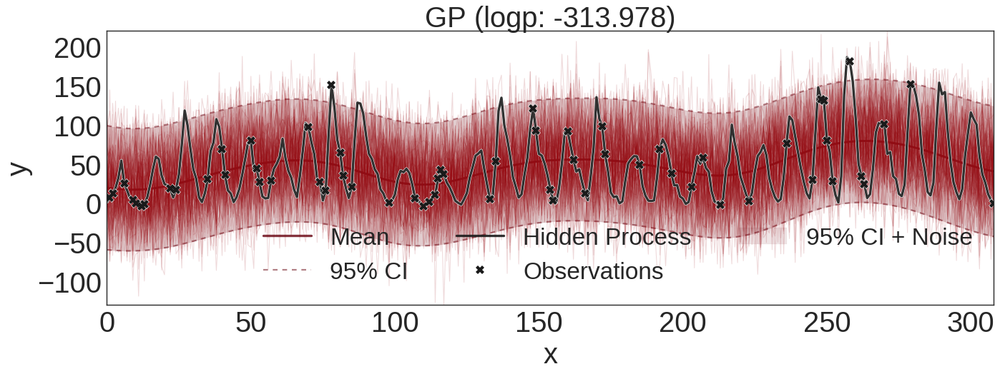

'Starting function value (-logp): 319.155'
'start_powell'
Optimization terminated successfully.
         Current function value: 304.616089
         Iterations: 9
         Function evaluations: 507
'find_MAP'
{'GP_Bias_Bias': array(49.623294830322266, dtype=float32),
 'GP_KernelNoise_var_log_': array(-1.8126201629638672, dtype=float32),
 'GP_SE_rate_log_': array([-0.56482261], dtype=float32),
 'GP_SE_var_log_': array(7.604351997375488, dtype=float32)}


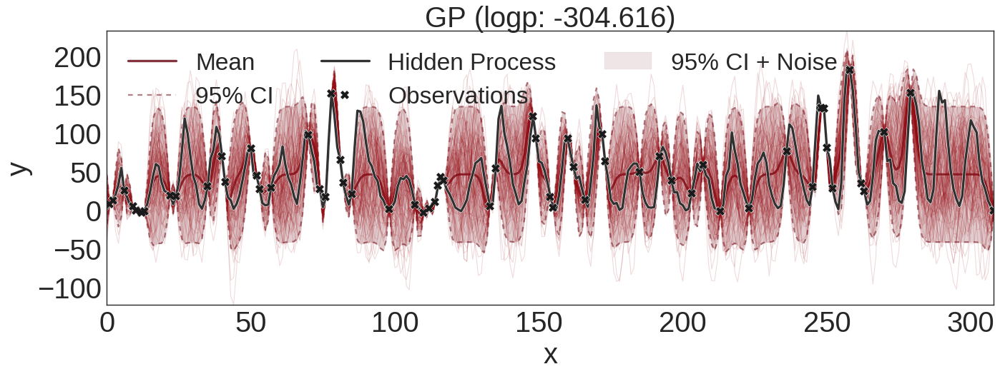

In [5]:
p = gp.find_MAP(points=1, init='bfgs')
gp.plot(p, samples=100)
g3.show()
p = gp.find_MAP(points=1, init='powell')
gp.plot(p, samples=100)

# WGP BoxCoxShifted SE + KernelNoise (OK)

In [6]:
wgp = g3.WarpedGaussianProcess(space=x, location=g3.Bias(x), kernel=g3.SE(x) + g3.KernelNoise(x), 
                               mapping=g3.BoxCoxShifted(), hidden = y, noisy=False)
wgp.observed(x_obs, y_obs)

'Starting function value (-logp): 319.155'
'start_bfgs'
         Current function value: 310.496399
         Iterations: 5
         Function evaluations: 67
         Gradient evaluations: 62
'find_MAP'
{'WGP_Bias_Bias': array(48.5776481628418, dtype=float32),
 'WGP_BoxShift_power_log_': array(-0.15294823050498962, dtype=float32),
 'WGP_BoxShift_shift': array(0.6855599880218506, dtype=float32),
 'WGP_KernelNoise_var_log_': array(6.020316123962402, dtype=float32),
 'WGP_SE_rate_log_': array([-3.41818976], dtype=float32),
 'WGP_SE_var_log_': array(6.169418811798096, dtype=float32)}


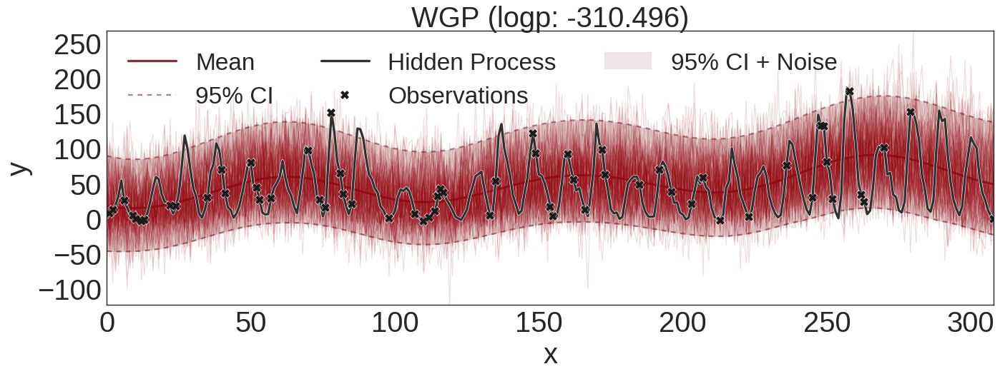

'Starting function value (-logp): 319.155'
'start_powell'
Optimization terminated successfully.
         Current function value: 282.669708
         Iterations: 11
         Function evaluations: 1161
'find_MAP'
{'WGP_Bias_Bias': array(16.796775817871094, dtype=float32),
 'WGP_BoxShift_power_log_': array(-0.39291009306907654, dtype=float32),
 'WGP_BoxShift_shift': array(1.4389932388031434e-12, dtype=float32),
 'WGP_KernelNoise_var_log_': array(4.639619827270508, dtype=float32),
 'WGP_SE_rate_log_': array([-2.80946803], dtype=float32),
 'WGP_SE_var_log_': array(3.7835240364074707, dtype=float32)}


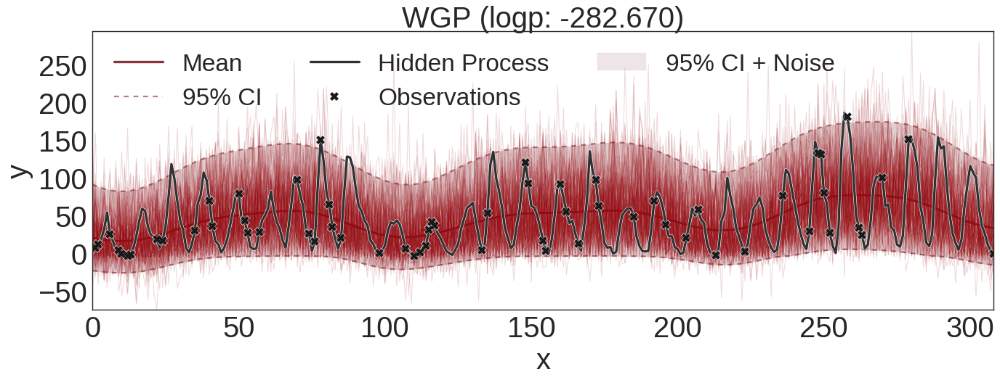

In [7]:
wp = wgp.find_MAP(points=1, init='bfgs')
wgp.plot(wp, samples=100)
g3.show()
wp = wgp.find_MAP(points=1, init='powell')
wgp.plot(wp, samples=100)

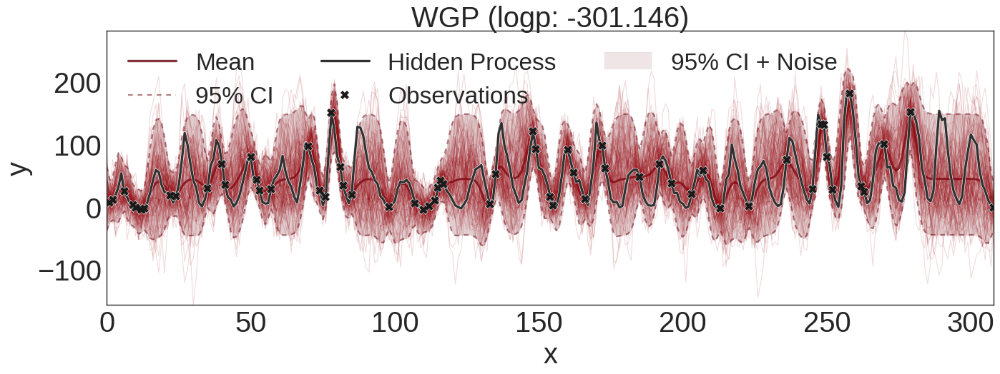

In [8]:
from numpy import float32, array
wp = {'WGP_Bias_Bias': array(21.47203826904297, dtype=float32),
 'WGP_BoxShift_power_log_': array(-0.14812663197517395, dtype=float32),
 'WGP_BoxShift_shift': array(-13.90000057220459, dtype=float32),
 'WGP_KernelNoise_var_log_': array(4.483116149902344, dtype=float32),
 'WGP_SE_rate_log_': array([-0.7333588], dtype=float32),
 'WGP_SE_var_log_': array(6.702595233917236, dtype=float32)}
wgp.plot(wp, samples=100)

'Starting function value (-logp): 319.155'
'start_bfgs'
         Current function value: 310.496399
         Iterations: 5
         Function evaluations: 67
         Gradient evaluations: 62
'start_powell'
Optimization terminated successfully.
         Current function value: 282.669708
         Iterations: 11
         Function evaluations: 1161
'start_bfgs_powell'
Optimization terminated successfully.
         Current function value: 278.460815
         Iterations: 16
         Function evaluations: 1575
'start_powell_bfgs'
         Current function value: 282.669708
         Iterations: 0
         Function evaluations: 77
         Gradient evaluations: 65
'find_MAP'
{'WGP_Bias_Bias': array(8.589526176452637, dtype=float32),
 'WGP_BoxShift_power_log_': array(-0.7597819566726685, dtype=float32),
 'WGP_BoxShift_shift': array(-3.000000238418579, dtype=float32),
 'WGP_KernelNoise_var_log_': array(-1.1031395196914673, dtype=float32),
 'WGP_SE_rate_log_': array([-0.69550884], dtype=float32),

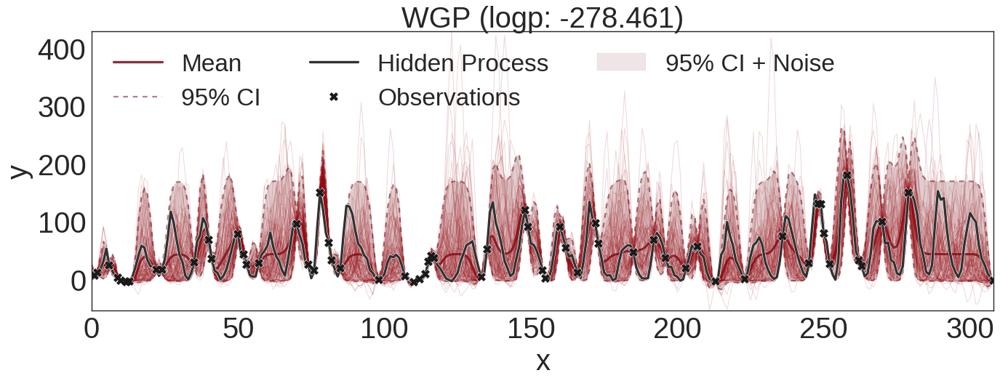

In [9]:
wp = wgp.find_MAP(points=4)
wgp.plot(wp, samples=100)

# Noisy GP Zero SE (OK)

In [10]:
gp = g3.GaussianProcess(space=x, location=g3.Zero(x), kernel=g3.SE(x), 
                        hidden = y, noisy=True)
gp.observed(x_obs, y_obs)

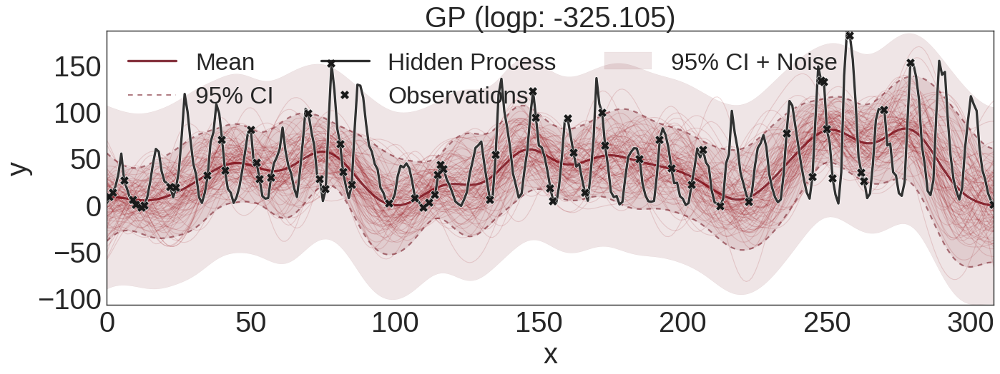

In [12]:
gp.plot(samples=100)

'Starting function value (-logp): 325.105'
'start_bfgs'
         Current function value: 317.266785
         Iterations: 12
         Function evaluations: 20
         Gradient evaluations: 19
'find_MAP'
{'GP_Noise_var_log_': array(7.452547550201416, dtype=float32),
 'GP_SE_rate_log_': array([-5.91072893], dtype=float32),
 'GP_SE_var_log_': array(8.13337230682373, dtype=float32)}


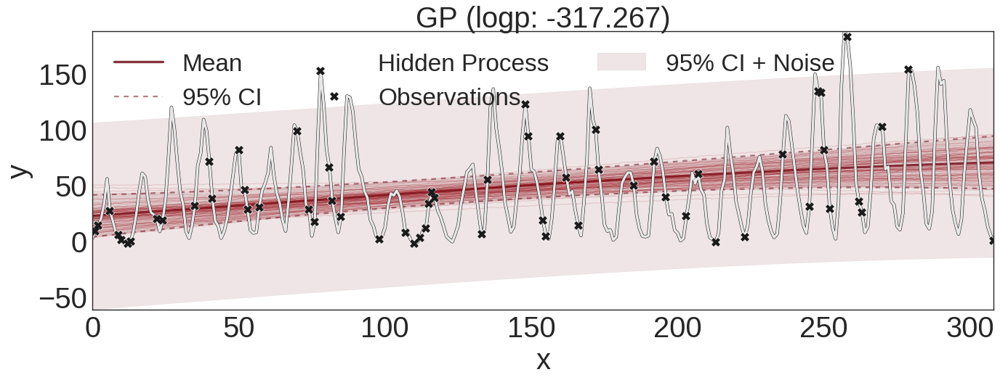

'Starting function value (-logp): 325.105'
'start_powell'
Optimization terminated successfully.
         Current function value: 317.364838
         Iterations: 2
         Function evaluations: 93
'find_MAP'
{'GP_Noise_var_log_': array(7.265478610992432, dtype=float32),
 'GP_SE_rate_log_': array([-3.63060069], dtype=float32),
 'GP_SE_var_log_': array(7.806285858154297, dtype=float32)}


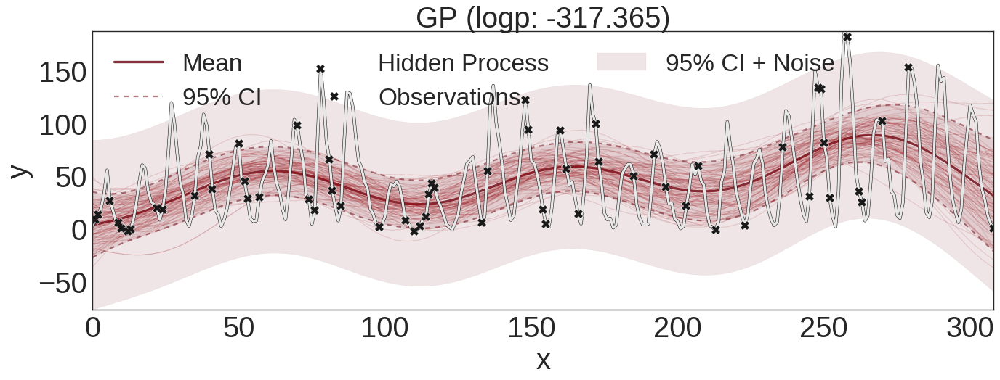

In [62]:
p = gp.find_MAP(points=1, init='bfgs')
gp.plot(p, samples=100)
g3.show()
p = gp.find_MAP(points=1, init='powell')
gp.plot(p, samples=100)

# Noisy GP Bias SE (OK)

In [13]:
gp = g3.GaussianProcess(space=x, location=g3.Bias(x), kernel=g3.SE(x), 
                        hidden = y, noisy=True)
gp.observed(x_obs, y_obs)

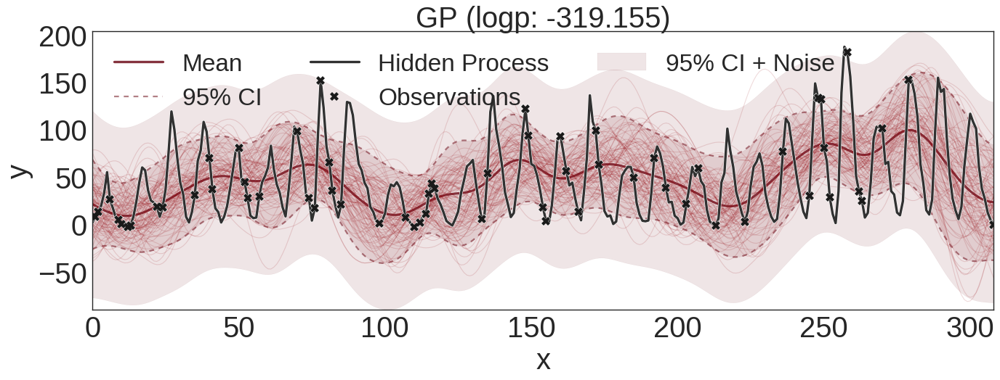

In [14]:
gp.plot(samples=100)

'Starting function value (-logp): 319.155'
'start_bfgs'
         Current function value: 313.977722
         Iterations: 13
         Function evaluations: 102
         Gradient evaluations: 90
'find_MAP'
{'GP_Bias_Bias': array(47.96167755126953, dtype=float32),
 'GP_Noise_var_log_': array(7.282400131225586, dtype=float32),
 'GP_SE_rate_log_': array([-3.01635551], dtype=float32),
 'GP_SE_var_log_': array(6.169084072113037, dtype=float32)}


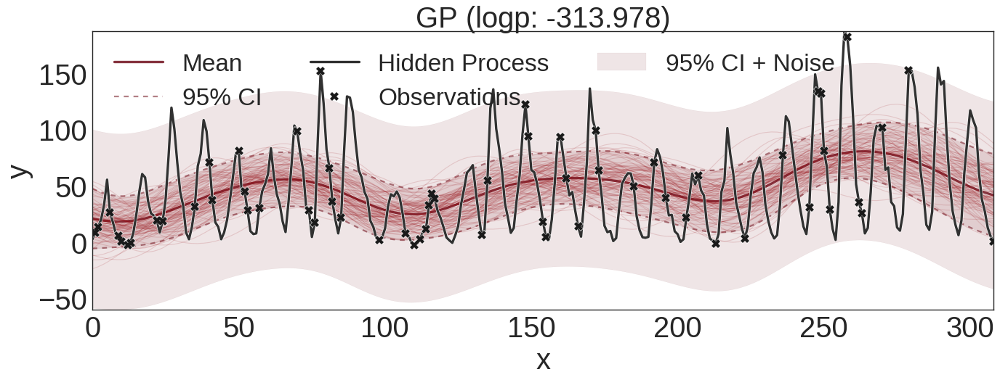

'Starting function value (-logp): 319.155'
'start_powell'
Optimization terminated successfully.
         Current function value: 304.616089
         Iterations: 9
         Function evaluations: 507
'find_MAP'
{'GP_Bias_Bias': array(49.623294830322266, dtype=float32),
 'GP_Noise_var_log_': array(-1.8126201629638672, dtype=float32),
 'GP_SE_rate_log_': array([-0.56482261], dtype=float32),
 'GP_SE_var_log_': array(7.604351997375488, dtype=float32)}


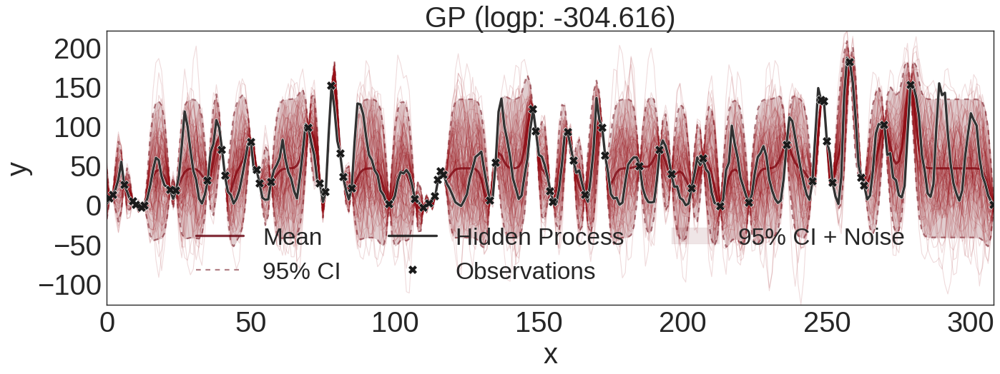

In [15]:
p = gp.find_MAP(points=1, init='bfgs')
gp.plot(p, samples=100)
g3.show()
p = gp.find_MAP(points=1, init='powell')
gp.plot(p, samples=100)

# Noisy WGP BoxCoxShifted Bias SE (OK)

In [19]:
wgp = g3.WarpedGaussianProcess(space=x, location=g3.Bias(x), kernel=g3.SE(x), 
                               mapping=g3.BoxCoxShifted(), hidden = y, noisy=True)
wgp.observed(x_obs, y_obs)

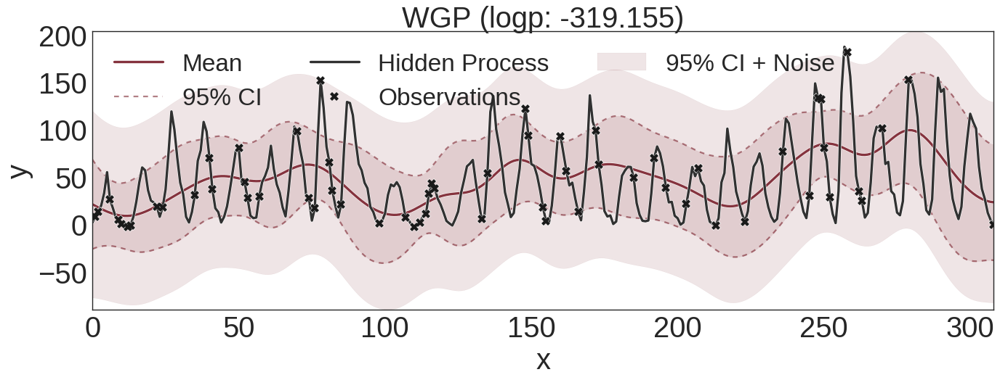

In [20]:
wgp.plot()

'Starting function value (-logp): 319.155'
'start_bfgs'
         Current function value: 310.496399
         Iterations: 5
         Function evaluations: 67
         Gradient evaluations: 62
'find_MAP'
{'WGP_Bias_Bias': array(48.5776481628418, dtype=float32),
 'WGP_BoxShift_power_log_': array(-0.15294823050498962, dtype=float32),
 'WGP_BoxShift_shift': array(0.6855599880218506, dtype=float32),
 'WGP_Noise_var_log_': array(6.020316123962402, dtype=float32),
 'WGP_SE_rate_log_': array([-3.41818976], dtype=float32),
 'WGP_SE_var_log_': array(6.169418811798096, dtype=float32)}


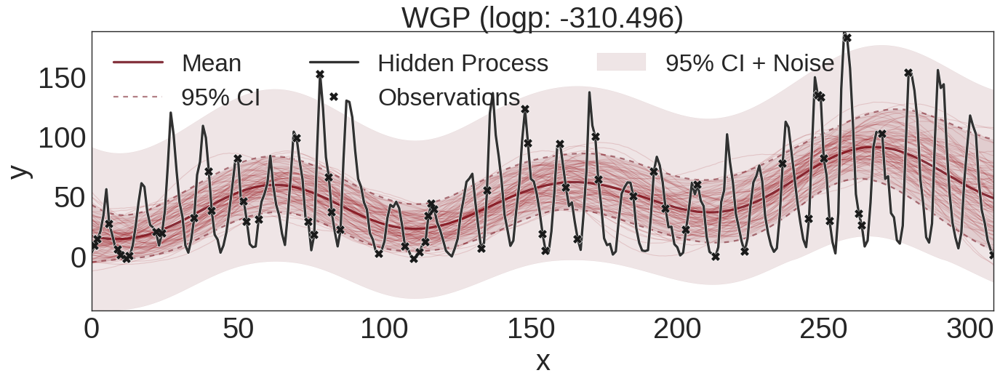

'Starting function value (-logp): 319.155'
'start_powell'
Optimization terminated successfully.
         Current function value: 282.669708
         Iterations: 11
         Function evaluations: 1161
'find_MAP'
{'WGP_Bias_Bias': array(16.796775817871094, dtype=float32),
 'WGP_BoxShift_power_log_': array(-0.39291009306907654, dtype=float32),
 'WGP_BoxShift_shift': array(1.4389932388031434e-12, dtype=float32),
 'WGP_Noise_var_log_': array(4.639619827270508, dtype=float32),
 'WGP_SE_rate_log_': array([-2.80946803], dtype=float32),
 'WGP_SE_var_log_': array(3.7835240364074707, dtype=float32)}


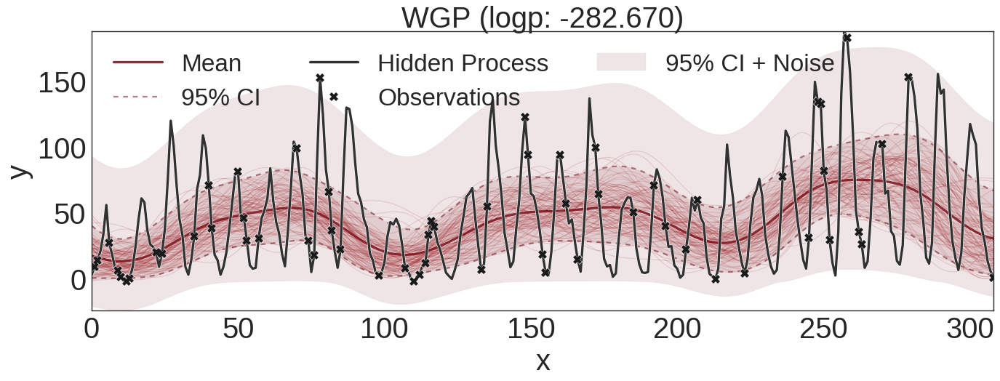

In [21]:
wp = wgp.find_MAP(points=1, init='bfgs')
wgp.plot(wp, samples=100)
g3.show()
wp = wgp.find_MAP(points=1, init='powell')
wgp.plot(wp, samples=100)

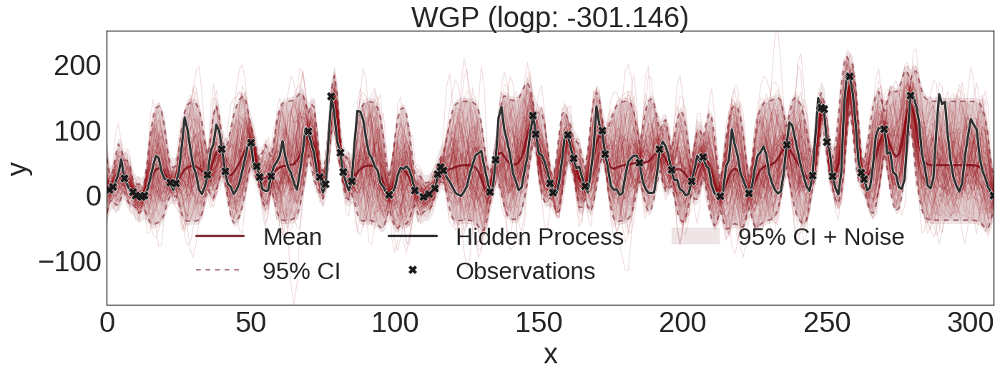

In [23]:
wp = {'WGP_Bias_Bias': array(21.47203826904297, dtype=float32),
 'WGP_BoxShift_power_log_': array(-0.14812663197517395, dtype=float32),
 'WGP_BoxShift_shift': array(-13.90000057220459, dtype=float32),
 'WGP_Noise_var_log_': array(4.483116149902344, dtype=float32),
 'WGP_SE_rate_log_': array([-0.7333588], dtype=float32),
 'WGP_SE_var_log_': array(6.702595233917236, dtype=float32)}
wgp.plot(wp, samples=100)